<p><img height="150px" src="https://esacademic.com/pictures/eswiki/69/Escudo-UdeA.svg" align="left" hspace="10px" vspace="0px"></p>

<br>
<br>
<center> <h1> <b> PROYECTO FINAL: Homicidios en Medellín </b> </h1>
<h2> Ana María López Aristizábal </h2> </center>

<center> <i>
<br> Instituto de Física - Pregrado de Astronomía
<br> Analítica de Datos
</i> </center>

<center> <h1> <b> Problemáticas en Medellín. </b> </h1>
<br>
<body style=”text-align: justify;”>
Para nadie es un secreto que Medellín muchas veces suele ser motivo de noticia y no necesariamente por cosas buenas, a partir de la década de los ochentas la ciudad se tornó como un epicentro de violencia, mucho se habla de que las cosas han cambiado, pero aun en la actualidad la inseguridad sigue siendo uno de los problemas más alarmantes de la ciudad, los homicidios son algo que sigue sucediendo y no son precisamente algo extraño en la ciudad. En torno a esto me surge la inquietud de querer análizar cómo a lo largo de los últimos años se ha tornado la situación respecto a los homicidios en la ciudad.
</body>

<p><img height="100px" src="https://medellin.gov.co/irj/go/km/docs/etc/PortalMedellin/images/imagenFacebook.jpg" align="right" hspace="10px" vspace="0px"></p>
<center> <h1> <b> Datos utilizados. </b> </h1>
<br>
<body style=”text-align: justify;”>
El DataSet fue extraído de la página web de datos abiertos de la Alcaldía de Medellín (MEData), contiene información acerca de los homicidios cometidos en la ciudad desde el primero de enero de 2003 hasta el 24 de octubre de 2019.
</body>
    
Los datos pueden ser revisados aquí: [aquí](http://medata.gov.co/dataset/homicidio/resource/69227f85-8049-4abf-8e99-e4414652e313#{currentView:!grid})


<p><img height="100px" src="https://thumbs.gfycat.com/DifferentGargantuanAdamsstaghornedbeetle-max-1mb.gif" align="left" hspace="10px" vspace="0px"></p>
<center> <h1> <b> Hipótesis nula. </b> </h1>
<br>
<body style=”text-align: justify;”>
- La cantidad de homicidios en la ciudad de mantiene aproximadamente constante a lo largo de los últimos años.
    <br>
- Factores como el sexo, la edad y el barrio influyen en la cantidad de casos.
</body>


<p><img height="100px" src="https://www.gestion.org/wp-content/uploads/2012/04/publico-objetivo.png" align="right" hspace="10px" vspace="0px"></p>

<center> <h1> <b> Objetivos. </b> </h1>
<br>
- Analizar como ha variado la cantidad de homicididos en los últimos años en la ciudad de Medellín.   
<br>  
- Identificar los posibles factores de riesgo.
<br>  
-Identificar cuales son las causas y modalidades más comunes.
<br>
- Aplicar los conocimientos adquiridos en el curso.


In [ ]:
# Importamos librerías
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium

In [ ]:
path = "/home/ana/Descargas/"                           # Creamos el camino para encontrar los archivos
data = pd.read_csv(path + "homicidio.csv", sep=";")
print('-'*100)
print('El número de registros del dataset dado es: \t', data.shape[0])
print('El número de variables del dataset dado es: \t', data.shape[1])
print('-'*100)

----------------------------------------------------------------------------------------------------
El número de registros del dataset dado es: 	 18059
El número de variables del dataset dado es: 	 35
----------------------------------------------------------------------------------------------------


/home/ana/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (7,27) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
print(display(data))

,seguridad.fecha_hecho,seguridad.cantidad,seguridad.latitud,seguridad.longitud,seguridad.sexo,seguridad.edad,seguridad.estado_civil,seguridad.grupo_actor,seguridad.actividad_delictiva,seguridad.parentesco,...,seguridad.codigo_comuna,seguridad.lugar,seguridad.sede_receptora,seguridad.bien,seguridad.categoria_bien,seguridad.grupo_bien,seguridad.modelo,seguridad.color,seguridad.permiso,seguridad.unidad_medida
0,2006-01-12 07:00:00,1.0,6.277977,-75.553721,Hombre,18,NaN,NaN,NaN,NaN,...,4.0,NaN,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
1,2006-01-13 01:00:00,1.0,6.292444,-75.581093,Hombre,20,NaN,NaN,NaN,NaN,...,6.0,NaN,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
2,2006-11-06 10:00:00,1.0,6.292367,-75.569388,Hombre,38,NaN,NaN,NaN,NaN,...,5.0,NaN,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
3,2005-11-11 22:00:00,1.0,6.254663,-75.598775,Hombre,25,NaN,NaN,NaN,NaN,...,12.0,NaN,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
4,2006-02-16 05:00:00,1.0,NaN,NaN,Hombre,30,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18054,2018-07-26 13:25:00,1.0,6.223392,-75.609657,Mujer,24,Soltero,NaN,NaN,NaN,...,16.0,Residencia,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
18055,2018-08-03 13:44:00,1.0,6.248381,-75.622650,Hombre,17,Soltero,NaN,NaN,NaN,...,13.0,Vía pública,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
18056,2018-08-20 09:25:00,1.0,6.264494,-75.547615,Mujer,38,Unión marital de hecho,NaN,NaN,NaN,...,3.0,Residencia,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
18057,2018-07-12 00:00:00,1.0,6.250220,-75.621910,Hombre,22,Soltero,NaN,NaN,NaN,...,13.0,Vía pública,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato


None


<center> <h2> <b> Descripción de variables. </b> </h2> </center>
<br>

* **Fechas del hecho:** año, mes, dia y hora en el que se cometió el homicidio.
* **Cantidad:** contador.
* **Latitud y Longitud:** Coodenadas del lugar donde se cometió el homicidio.
* **Sexo:** Sexo de la persona que fue asesinada.
* **Edad:** Edad de la víctima.
* **Grupo actor:** Grupo al que se adjudicó la responsabilidad del homicidio.
* **Actividad delictiva:** Actividad delictiva que practicaba la víctima si es el caso.
* **Parentesco:** Relación entre la víctima y el victimario.
* **Código comuna:** Comuna en la que se cometió el homicidio.

In [ ]:
display(data.dtypes)    #Para obtener el tipo de dato de cada una de las variables del dataset

seguridad.fecha_hecho             object
seguridad.cantidad               float64
seguridad.latitud                float64
seguridad.longitud               float64
seguridad.sexo                    object
seguridad.edad                     int64
seguridad.estado_civil            object
seguridad.grupo_actor             object
seguridad.actividad_delictiva     object
seguridad.parentesco              object
seguridad.ocupacion               object
seguridad.discapacidad            object
seguridad.grupo_especial          object
seguridad.medio_transporte        object
seguridad.nivel_academico         object
seguridad.testigo                 object
seguridad.conducta                object
seguridad.modalidad               object
seguridad.caracterizacion         object
seguridad.conducta_especial       object
seguridad.arma_medio              object
seguridad.articulo_penal          object
seguridad.categoria_penal         object
seguridad.nombre_barrio           object
seguridad.codigo

In [ ]:
# Manipulamos la información dada en fecha para facilitar su uso
fecha = data["seguridad.fecha_hecho"].str.split('-',expand=True)
data = data.drop(['seguridad.fecha_hecho'], axis=1)
fecha.columns = ['año', 'mes', 'dia-hora']
hora = fecha["dia-hora"].str.split(expand=True)
fecha = fecha.drop(['dia-hora'], axis=1)
hora.columns = ['dia','hora']
horareal= hora['hora'].str.split(':',expand=True)
hora = hora.drop(['hora'], axis=1)
horareal.columns = ['hora','minuto','segundo']
data = pd.concat([fecha, hora, horareal['hora'], data], axis=1)
print(display(data))

,año,mes,dia,hora,seguridad.cantidad,seguridad.latitud,seguridad.longitud,seguridad.sexo,seguridad.edad,seguridad.estado_civil,...,seguridad.codigo_comuna,seguridad.lugar,seguridad.sede_receptora,seguridad.bien,seguridad.categoria_bien,seguridad.grupo_bien,seguridad.modelo,seguridad.color,seguridad.permiso,seguridad.unidad_medida
0,2006,01,12,07,1.0,6.277977,-75.553721,Hombre,18,NaN,...,4.0,NaN,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
1,2006,01,13,01,1.0,6.292444,-75.581093,Hombre,20,NaN,...,6.0,NaN,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
2,2006,11,06,10,1.0,6.292367,-75.569388,Hombre,38,NaN,...,5.0,NaN,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
3,2005,11,11,22,1.0,6.254663,-75.598775,Hombre,25,NaN,...,12.0,NaN,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
4,2006,02,16,05,1.0,NaN,NaN,Hombre,30,NaN,...,NaN,NaN,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18054,2018,07,26,13,1.0,6.223392,-75.609657,Mujer,24,Soltero,...,16.0,Residencia,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
18055,2018,08,03,13,1.0,6.248381,-75.622650,Hombre,17,Soltero,...,13.0,Vía pública,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
18056,2018,08,20,09,1.0,6.264494,-75.547615,Mujer,38,Unión marital de hecho,...,3.0,Residencia,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato
18057,2018,07,12,00,1.0,6.250220,-75.621910,Hombre,22,Soltero,...,13.0,Vía pública,NaN,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato,Sin dato


None


In [ ]:
# Para identificar el total de homicidios por año
d_año=data.groupby(['año']).sum()
print(display(d_año))


,seguridad.cantidad,seguridad.latitud,seguridad.longitud,seguridad.edad,seguridad.codigo_comuna
año,,,,,
2003,2007.0,10175.001977,-122727.082413,57338,15668.0
2004,1187.0,6438.237629,-77690.087518,36216,9302.0
2005,782.0,4150.244496,-50106.025464,25241,7053.0
2006,804.0,4682.385520,-56529.766706,26064,7343.0
2007,771.0,4400.879941,-53130.029748,24162,6941.0
2008,1045.0,5967.751010,-72022.966566,33294,8911.0
2009,2186.0,13126.280939,-158330.735281,65060,22562.0
2010,2022.0,12281.590225,-148207.935013,59486,24454.0
2011,1651.0,10262.538029,-124036.707430,48340,30908.0


None


In [ ]:
d_año = d_año.drop(['seguridad.latitud','seguridad.longitud','seguridad.edad','seguridad.codigo_comuna'], axis=1)
d_año.T

año,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
seguridad.cantidad,2007.0,1187.0,782.0,804.0,771.0,1045.0,2186.0,2022.0,1651.0,1248.0,927.0,659.0,496.0,544.0,582.0,634.0,514.0


In [ ]:
fig=px.bar(d_año,width=1500, height=600)
fig.update_layout(title_text='Homicidios por año',title_x=0.45,titlefont=dict(size=35),yaxis=dict(
        title_text="cantidad de homicidios",titlefont=dict(size=25)),xaxis=dict(
        title_text="año",titlefont=dict(size=25)))
fig.show()

[comparación](https://www.medellincomovamos.org/node/17515)

Notamos que partiendo del 2003 hay una disminución en la cantidad de homicidios hasta el 2007 en donde inicia un aumento el cual llega a su máximo para el año 2009 en donde tenemos el aumento más grande de homicidios de los últimos años, a partir de 2009 los casos de homicidio disminuyen aproximadamente hasta el 2014, año desde el cual los homicidios se han mantenido aproximadamente constantes. Por tanto, a diferencia de lo que se planteó en la hipótesis nula **si** se han presentado fructuaciones considerables en los casos de homicidi por año.


Ahora, lo que haremos es realizar una pequeña inspección de los posibles valores ue pueden tomar nuestras variables.

In [ ]:
data['seguridad.sexo'].unique()

array(['Hombre', 'Mujer'], dtype=object)

In [ ]:
data['seguridad.grupo_actor'].unique()

array([nan, 'Delincuencia', 'Grupo armado', 'Ninguno', 'BACRIM'],
      dtype=object)

In [ ]:
data['seguridad.actividad_delictiva'].unique()

array([nan, 'Jíbaro', 'Ladrón', 'Extorsionista', 'Proveedor de droga',
       'Sicario', 'Proxeneta', 'Integrante de grupo delincuencial',
       'Ninguno', 'Fletero', 'Paga diario', 'Jefe de grupo delincuencial',
       'Carrito', 'Secuestrador', 'Campanero', 'Financiero',
       'Lavador de dinero', 'Vigilante'], dtype=object)

In [ ]:
data['seguridad.parentesco'].unique()

array([nan, 'Cónyuge o compañero', 'Desconocido',
       'Excónyuge o excompañero', 'Exnovio', 'Exyerno', 'Vecino(a)',
       'Cuñado(a)', 'Conocido', 'Novio(a)', 'Primo(a)', 'Nieto(a)',
       'Padrastro', 'Amante', 'Cliente', 'Enemigo', 'Tío (A) político',
       'Yerno', 'Hermano(a)', 'Inquilino(a)', 'Empleado', 'Amigo(a)'],
      dtype=object)

In [ ]:
data['seguridad.grupo_especial'].unique()

array([nan, 'Habitante de calle', 'Consumidor de estupefacientes',
       'LGBTI', 'Desplazado', 'VIH', 'Hincha', 'Ex convicto',
       'Sindicalista', 'Persona en situación de calle', 'No',
       'Privado de la libertad', 'Ex miembro de la fuerza pública',
       'Denunciante', 'trabajo sexual', 'Líder comunitario',
       'Desmovilizado', 'Campesino'], dtype=object)

In [ ]:
data['seguridad.medio_transporte'].unique()

array([nan, 'Caminata', 'Motocicleta', 'Automóvil', 'Taxi',
       'Motocicleta con parrillero', 'Bicicleta', 'Silla de ruedas',
       'Autobus', 'Camioneta', 'Metrocable', 'Avioneta',
       'Vehículo blindado'], dtype=object)

In [ ]:
data['seguridad.modalidad'].unique()

array(['Arma de fuego', 'Cortopunzante', 'Contundente',
       'Ahorcamiento o estrangulamiento', 'Explosivo', 'Asfixia mecánica',
       'Por establecer', 'Lanzamiento al vacío',
       'Tóxico o agente químico', 'Sumersión'], dtype=object)

In [ ]:
data['seguridad.lugar'].unique()

array([nan, 'Vía pública', 'Residencia', 'Zona despoblada',
       'Almacén tienda y otro', 'Bar o cantina', 'Lavadero de carros',
       'Río Medellín', 'Vehículo particular', 'Puesto de trabajo',
       'Escenario deportivo', 'Puente peatonal', 'Edificio',
       'Centro de belleza o estética', 'Taxi', 'Billar', 'Quebrada o rio',
       'Zona boscosa', 'Casa o apartamento', 'Parque', 'Restaurante',
       'Parqueadero', 'Fábrica o empresa', 'Finca',
       'Hotel, motel y hostal', 'Local comercial', 'Centro de reciclaje',
       'Inquilinato', 'Estación de Policía', 'Lote baldío',
       'Bus de servicio público', 'Taller mecánico', 'Panadería',
       'Puente', 'Estación del Metro', 'Hospital o centro de salud',
       'Institución educativa (jardín, primaria o secundaria)',
       'Conjunto residencial', 'Supermercado', 'Oficina', 'Cementerio',
       'Metro cable', 'Iglesia', 'Hogar de paso', 'Hogar geriátrico',
       'Cafetería', 'Casino', 'Bodega', 'Plaza de mercado',
       'E

In [ ]:
data['seguridad.caracterizacion'].unique()

array(['En proceso de categorización',
       'Grupos Delincuenciales Organizados', 'Violencia de género',
       'Homicidios asociados a hurtos', 'Convivencia',
       'En procedimiento de la fuerza pública', 'Violencia intrafamiliar',
       'Homicidios culposos'], dtype=object)

In [ ]:
data['seguridad.bien'].unique()

array(['Sin dato'], dtype=object)

Inspeccionamos la cantidad de valores nulos para así de las variables que nos han llamado la atención extraer las más completas.

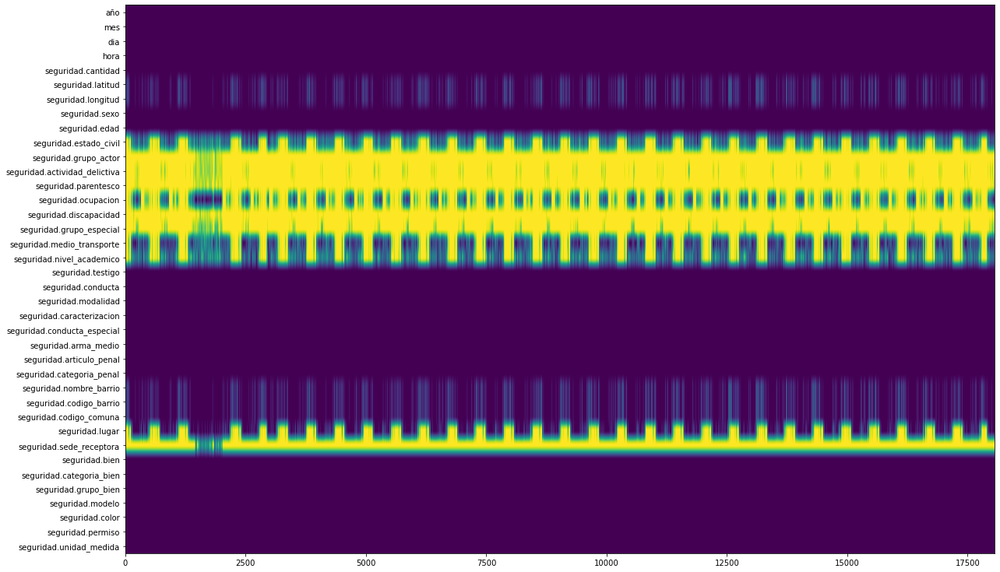

In [ ]:
ax = plt.figure(figsize=(20,25)).add_subplot(111)
ax.imshow(data.isna().values.T)
ax.set_aspect(300)
plt.yticks(range(data.shape[1]), data.columns);

Ahora construimos un nuevo DataFrame extrayéndo unicamene las variables de las que haremos uso

In [ ]:
nuevo = pd.DataFrame()
nuevo['AÑO'] = data['año']
nuevo['MES'] = data['mes']
nuevo['DIA'] = data['dia']
nuevo['HORA'] = data['hora']
nuevo['CONTADOR'] = data['seguridad.cantidad']
nuevo['LATITUD'] = data['seguridad.latitud']
nuevo['LONGITUD'] = data['seguridad.longitud']
nuevo['SEXO'] = data['seguridad.sexo']
nuevo['EDAD'] = data['seguridad.edad']
nuevo['MEDIO_TRANSPORTE'] = data['seguridad.medio_transporte']
nuevo['MODALIDAD'] = data['seguridad.modalidad']
nuevo['CARACTERIZACION'] = data['seguridad.caracterizacion']
nuevo['COMUNA'] = data['seguridad.codigo_comuna']
print(display(nuevo))

,AÑO,MES,DIA,HORA,CONTADOR,LATITUD,LONGITUD,SEXO,EDAD,MEDIO_TRANSPORTE,MODALIDAD,CARACTERIZACION,COMUNA
0,2006,01,12,07,1.0,6.277977,-75.553721,Hombre,18,NaN,Arma de fuego,En proceso de categorización,4.0
1,2006,01,13,01,1.0,6.292444,-75.581093,Hombre,20,NaN,Arma de fuego,En proceso de categorización,6.0
2,2006,11,06,10,1.0,6.292367,-75.569388,Hombre,38,NaN,Cortopunzante,En proceso de categorización,5.0
3,2005,11,11,22,1.0,6.254663,-75.598775,Hombre,25,NaN,Arma de fuego,En proceso de categorización,12.0
4,2006,02,16,05,1.0,NaN,NaN,Hombre,30,NaN,Arma de fuego,En proceso de categorización,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18054,2018,07,26,13,1.0,6.223392,-75.609657,Mujer,24,Caminata,Arma de fuego,Grupos Delincuenciales Organizados,16.0
18055,2018,08,03,13,1.0,6.248381,-75.622650,Hombre,17,Caminata,Arma de fuego,Grupos Delincuenciales Organizados,13.0
18056,2018,08,20,09,1.0,6.264494,-75.547615,Mujer,38,Caminata,Cortopunzante,Violencia intrafamiliar,3.0
18057,2018,07,12,00,1.0,6.250220,-75.621910,Hombre,22,Motocicleta,Arma de fuego,Grupos Delincuenciales Organizados,13.0


None


<center> <h1> <b> Variables Continuas. </b> </h1>

In [ ]:
#Para tener una descripción de nuestras variables continuas
nuevo.describe()

,CONTADOR,LATITUD,LONGITUD,EDAD,COMUNA
count,18059.0,17010.000000,17010.000000,18059.000000,17005.000000
mean,1.0,6.259947,-75.579017,30.443878,13.549897
std,0.0,0.029135,0.028077,12.108190,17.960539
min,1.0,6.165525,-75.712999,-1.000000,1.000000
25%,1.0,6.243326,-75.598385,22.000000,5.000000
50%,1.0,6.259737,-75.573379,28.000000,9.000000
75%,1.0,6.283843,-75.558478,37.000000,13.000000
max,1.0,6.367987,-75.493371,99.000000,90.000000


In [ ]:
#Se define para darle formato al gráfico box-plot
medianprops = {'color': 'red', 'linewidth': 2}
boxprops = {'color': 'blue', 'linestyle': '-'}
whiskerprops = {'color': 'blue', 'linestyle': '--'}
capprops = {'color': 'black', 'linestyle': '-'}
flierprops = {'marker': '.'}

Text(0.5, 1.0, 'Edad')

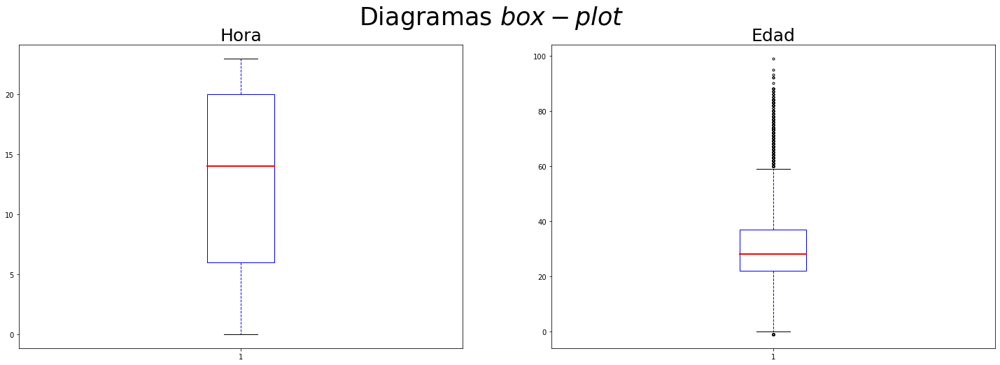

In [ ]:
fig, ((ax0, ax1)) = plt.subplots(1,2, figsize=(25, 8))
fig.suptitle('Diagramas $box-plot$', size=35)
tnan = nuevo['HORA'].dropna()
tamaño= ax0.boxplot(tnan.astype(int), medianprops=medianprops,boxprops=boxprops,whiskerprops=whiskerprops,capprops=capprops,flierprops=flierprops)
ax0.set_title('Hora', size=25)
inan = nuevo['EDAD'].dropna()
internet = ax1.boxplot(inan.astype(int), medianprops=medianprops,boxprops=boxprops,whiskerprops=whiskerprops,capprops=capprops,flierprops=flierprops)
ax1.set_title('Edad', size=25)

Este gráfico no es una buena idea para análizar la hora del homicidio, ya que por ejemplo, si un homicidio fue cometido a las 23:00 (once de la noche) y otro a la 1:00 (una de la mañana) el promedio de estos dos datos será las 12:00 (doce del medio día) cuando en realidad debería ser las 00:00 (doce de la noche). Para el cado de la edad el box plot si nos permite extraer bastante información, por ejemplo que los valores mayores a 60 se toman como atípicos, que el 50% de los homicios están concentrados en personas de edades entre 22(primer cuartil) y 37 años(tercer cuartil)

In [ ]:
#Para visualizar de manera más clara la información de la variable hora
d_hora=nuevo.groupby(['HORA']).sum()
print(display(d_hora.T))

HORA,00,01,02,03,04,05,06,07,08,09,...,14,15,16,17,18,19,20,21,22,23
CONTADOR,802.000000,875.000000,673.000000,583.000000,519.000000,555.000000,555.000000,582.000000,569.000000,544.000000,...,723.000000,716.000000,700.000000,782.000000,796.000000,943.000000,1245.000000,1281.000000,1092.000000,1091.000000
LATITUD,4782.967013,5032.662447,3858.055961,3487.495341,3068.353000,3292.812058,3250.047985,3418.244354,3293.369815,3030.601862,...,4319.006617,4244.609923,4136.714355,4643.065501,4774.664626,5715.920373,7443.989905,7655.669917,6472.802459,6440.737334
LONGITUD,-57742.925665,-60764.564799,-46553.383261,-42095.159120,-37031.384874,-39753.097612,-39223.826689,-41264.964299,-39753.903536,-36578.990534,...,-52149.432828,-51243.063108,-49958.812382,-56082.771748,-57668.584470,-69007.385821,-89863.536987,-92434.710875,-78148.396113,-77772.893065
EDAD,23379.000000,25738.000000,19910.000000,16644.000000,15849.000000,17148.000000,17394.000000,18830.000000,17688.000000,17014.000000,...,22544.000000,21932.000000,21072.000000,24129.000000,25263.000000,29248.000000,37199.000000,38095.000000,32000.000000,32079.000000
COMUNA,10813.000000,10181.000000,7136.000000,6417.000000,5244.000000,6383.000000,6884.000000,8597.000000,7607.000000,6310.000000,...,8890.000000,9025.000000,9605.000000,12393.000000,10766.000000,12785.000000,15804.000000,15753.000000,13616.000000,14983.000000


None


In [ ]:
# Tomamos unicamente la variable de interés
d_hora = d_hora.drop(['LATITUD','LONGITUD','EDAD','COMUNA'], axis=1)
d_hora.T

HORA,00,01,02,03,04,05,06,07,08,09,...,14,15,16,17,18,19,20,21,22,23
CONTADOR,802.0,875.0,673.0,583.0,519.0,555.0,555.0,582.0,569.0,544.0,...,723.0,716.0,700.0,782.0,796.0,943.0,1245.0,1281.0,1092.0,1091.0


In [ ]:
fig=px.bar(d_hora,width=1500, height=600)
fig.update_layout(title_text='Homicidios cometidos en la hora especificada',title_x=0.45,titlefont=dict(size=35),yaxis=dict(
        title_text="cantidad de homicidios",titlefont=dict(size=25)),xaxis=dict(
        title_text="hora",titlefont=dict(size=25)))
fig.show()

Las horas de mayor riesgo están entre las 19:00 (siete de la noche) y la 1:00 (una de la mañana), siendo las 21:00 (nueve de la noche) la hora más peligrosa. El resto de las horas del día el número de casos es aproximadamente constante.


Para ver con más claridad la información que nos proporciona la variable edad la vizualizaremos de la siguiente manera:

In [ ]:
#Realizamos el mismo procedimiento para agrupar y tomar el dato que necesitamos
edad=nuevo.groupby(['EDAD']).sum()
edad = edad.drop(['LATITUD','LONGITUD','COMUNA'], axis=1)
print(display(edad.T))

EDAD,-1,0,1,2,3,4,5,6,7,8,...,84,85,86,87,88,90,92,93,95,99
CONTADOR,10.0,9.0,10.0,10.0,2.0,10.0,7.0,7.0,2.0,11.0,...,9.0,3.0,3.0,3.0,4.0,1.0,2.0,1.0,1.0,1.0


None


In [ ]:
fig=px.line(edad,width=1500, height=600)
fig.update_layout(title_text='Edad de la víctima',title_x=0.45,titlefont=dict(size=35),yaxis=dict(
        title_text="cantidad de homicidios",titlefont=dict(size=25)),xaxis=dict(
        title_text="edad[años] ",titlefont=dict(size=25)))
fig.show()

A partir de los 12 años comienza una subida en la cantidad de homicidios llegando a su pico máximo en la edad de 25 años, a partir de ahí la tendencia es a disminuir aproximadamente hasta los 63 años en donde la cantidad de homicios pasa a ser casi constante y muy baja. La edad más crítica son los 25 años.


Utilizándo la información de las coordenadas del lugar donde se cometió el homicidio realizamos un gráfico geográfico que nos muestra en forma de mapa de calor las zonas donde se han cometido más homicios en los últimos años. Este mapa lo graficamos centrándolo en el promedio de las latitudes y longitudes, lo cual se acerca precisamente al centro de la ciudad de medellín.

In [ ]:
nuevo.drop(nuevo[nuevo.LATITUD.isnull()].index, inplace = True)
from folium.plugins import HeatMap
calor = folium.Map(location=[nuevo['LATITUD'].mean(), nuevo['LONGITUD'].mean()],tile='mapquestopen',zoom_start=12)
HeatMap(data=nuevo[['LATITUD', 'LONGITUD']], radius=12).add_to(calor)


In [ ]:
calor

En el mapa de calor entre más cercano se está al color rojo significa una mayor cantidad de homicidios y entre más cercano esté al azul quiere decir menor cantidad de homicios. En este orden de ideas notamos que hay mayor cantidad de casos cercano al centro de Medellín, pero no se logran identificar muy bien otras regiones de riesgo en la ciudad.

Observando los corregimientos encontramos que Santa Elena y San Sebastián de Palmitas parecen tener pocos casos de homicidios comparados con el resto de la ciudad.

<center> <h1> <b> Variables Categóricas. </b> </h1>

<p><img height="100px" src="http://1.bp.blogspot.com/-YMTjbJjOKz8/UAxmiBjl-xI/AAAAAAAAA_Y/FjC0zwHXD8s/s1600/-comunas_de_medellin-svg.png" align="right" hspace="10px" vspace="0px"></p>

<center> <h2> <b> Comunas. </b> </h2> </center>
<br>

* **Comuna 1:** Popular.
* **Comuna 2:** Santa Cruz.
* **Comuna 3:** Manrique.
* **Comuna 4:** Aranjuez.
* **Comuna 5:** Castilla.
* **Comuna 6:** Doce de Octubre.
* **Comuna 7:** Robledo.
* **Comuna 8:** Villa Hermosa.
* **Comuna 9:** Buenos Aires.


<p><img height="100px" src="http://1.bp.blogspot.com/-YMTjbJjOKz8/UAxmiBjl-xI/AAAAAAAAA_Y/FjC0zwHXD8s/s1600/-comunas_de_medellin-svg.png" align="right" hspace="10px" vspace="0px"></p>

* **Comuna 10:** La Candelaria.
* **Comuna 11:** Laureles - Estadio.
* **Comuna 12:** La América.
* **Comuna 13:** San Javier.
* **Comuna 14:** El Poblado.
* **Comuna 15:** Guayabal.
* **Comuna 16:** Belén.
* **Comuna 50:** San Sebastián de Palmitas.
* **Comuna 60:** San Cristobal.
* **Comuna 70:** Altavista.
* **Comuna 80:** San Antonio de Prado.
* **Comuna 90:** Santa Elena.

In [ ]:
# Realizamos el mismo procedimiento para la agropación
comuna=nuevo.groupby(['COMUNA']).sum()
comuna= comuna.drop(['LATITUD','LONGITUD','EDAD'], axis=1)
comuna.T

COMUNA,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,...,12.0,13.0,14.0,15.0,16.0,50.0,60.0,70.0,80.0,90.0
CONTADOR,738.0,570.0,959.0,1349.0,1152.0,1098.0,1203.0,999.0,587.0,2298.0,...,435.0,1571.0,231.0,714.0,1013.0,15.0,526.0,307.0,455.0,109.0


In [ ]:
fig=px.bar(comuna,width=1500, height=600)
fig.update_layout(title_text='Homicidios por comuna',title_x=0.45,titlefont=dict(size=35),yaxis=dict(
        title_text="cantidad de homicidios",titlefont=dict(size=25)),xaxis=dict(
        title_text="comuna",titlefont=dict(size=25)))
fig.show()

Lo que se puede observar en la gráfica coincide con lo que observamos en el gráfico geográfico y además podemos identificar otros sectores con alta cantidad de homicidios como son la comuna 13 (San Javier) y la comuna 4 (Aranjuez).

In [ ]:
fig=px.pie(nuevo, values='CONTADOR', names='SEXO',width=1200, height=800)
fig.update_layout(title_text='Porcentaje de homicidios por sexo',title_x=0.5,titlefont=dict(size=35))
fig.show()

La diferencia de casos entre los dos sexos es abrumadora, a grandes rasgos podemos decir que por cada mujer asesina han habido otros doce casos pero donde las víctimas han sido hombres.

In [ ]:
fig=px.pie(nuevo, values='CONTADOR', names='CARACTERIZACION',width=1200, height=800)
fig.update_layout(title_text='Porcentaje de homicidios por causalidad',title_x=0.5,titlefont=dict(size=35))
fig.show()

La gran mayoría de los casos que se tienen caracterizados han sido a causa de grupos de delincuencia organizada y hurtos. Veamos si discriminando por sexo notamos algunas diferencias:

In [ ]:
datosh=nuevo[nuevo['SEXO']=='Hombre']
d_datosh=datosh.groupby(['CARACTERIZACION']).sum()
d_datosh = d_datosh.drop(['LATITUD','LONGITUD','EDAD','COMUNA'], axis=1)
datosm=nuevo[nuevo['SEXO']=='Mujer']
d_datosm=datosm.groupby(['CARACTERIZACION']).sum()
d_datosm = d_datosm.drop(['LATITUD','LONGITUD','EDAD','COMUNA'], axis=1)

d_datosh['hombre']=d_datosh['CONTADOR']
d_datosh['mujer']=d_datosm['CONTADOR']
d_datosh = d_datosh.drop(['CONTADOR'], axis=1)
d_datosh



,hombre,mujer
CARACTERIZACION,,
Convivencia,985.0,71.0
En procedimiento de la fuerza pública,128.0,1.0
En proceso de categorización,7523.0,687.0
Grupos Delincuenciales Organizados,5544.0,239.0
Homicidios asociados a hurtos,2186.0,141.0
Homicidios culposos,98.0,47.0
Violencia de género,70.0,102.0
Violencia intrafamiliar,141.0,96.0


In [ ]:
fig=px.bar(d_datosh,width=1500, height=600)
fig.update_layout(title_text='Motivo del homicidio',title_x=0.45,titlefont=dict(size=35),yaxis=dict(
        title_text="cantidad de homicidios",titlefont=dict(size=25)),xaxis=dict(
        title_text="caracterización",titlefont=dict(size=25)))
fig.show()

Aunque los motivos se mantienen estables, y predominan los mismos si se nota por ejemplo una mayor proporción relacionada a casos de violencia intrafamiliar y violencia de género para el caso de las mujeres.

Teniendo en cuenta que un gran porcentaje de los casos es por motivos asociados a hurtos, podemos analizar si tiene alguna influencia el mes y el día con los casos de homicidio, teniendo en cuenta los días que regularmente se suelen realizar los pagos y meses que tiene prima para algunos trabajadores.

In [ ]:
#Agrupamos como ya lo hemos hecho
mes=nuevo.groupby(['MES']).sum()
mes= mes.drop(['LATITUD','LONGITUD','EDAD','COMUNA'], axis=1)

dia=nuevo.groupby(['DIA']).sum()
dia= dia.drop(['LATITUD','LONGITUD','EDAD','COMUNA'], axis=1)

In [ ]:
fig=px.line(mes,markers=True,width=1500, height=600)
fig.update_layout(title_text='Homicidios agrupados por mes',title_x=0.45,titlefont=dict(size=35),yaxis=dict(
        title_text="cantidad de homicidios",titlefont=dict(size=25)),xaxis=dict(
        title_text="mes",titlefont=dict(size=25)))
fig.show()

No notamos un aumento en los casos en los meses de junio y diciembre, que el valor más bajo sea febrero puede estar asociado a que es el mes con menor cantidad de días. No notamos una relación de los meses con el número de casos.

In [ ]:
fig=px.line(dia,markers=True,width=1500, height=600)
fig.update_layout(title_text='Homicidios agrupados por día del mes',title_x=0.45,titlefont=dict(size=35),yaxis=dict(
        title_text="cantidad de homicidios",titlefont=dict(size=25)),xaxis=dict(
        title_text="día",titlefont=dict(size=25)))
fig.show()

Aunque no hay una tendencia muy clara si se nota que el día 1 del mes es en el que se presentan más casos, el número tan bajo de casos en el día 31 se debe a que no todos los meses tienen 31 días.

In [ ]:
fig=px.pie(nuevo, values='CONTADOR', names='MODALIDAD',width=1200, height=800)
fig.update_layout(title_text='Porcentaje modalidad del homicidio',title_x=0.5,titlefont=dict(size=35))
fig.show()

Claramente la gran mayoría de los homicidios se cometen con arma de fuego. Nuevamente veamos si el sexo varía un poco la modalidad del homicidio.

In [ ]:
mdatosh=nuevo[nuevo['SEXO']=='Hombre']
md_datosh=mdatosh.groupby(['MODALIDAD']).sum()
md_datosh = md_datosh.drop(['LATITUD','LONGITUD','EDAD','COMUNA'], axis=1)
mdatosm=nuevo[nuevo['SEXO']=='Mujer']
md_datosm=mdatosm.groupby(['MODALIDAD']).sum()
md_datosm = md_datosm.drop(['LATITUD','LONGITUD','EDAD','COMUNA'], axis=1)

md_datosh['hombre']=md_datosh['CONTADOR']
md_datosh['mujer']=md_datosm['CONTADOR']
md_datosh = md_datosh.drop(['CONTADOR'], axis=1)
md_datosh

,hombre,mujer
MODALIDAD,,
Ahorcamiento o estrangulamiento,198.0,97.0
Arma de fuego,13345.0,806.0
Asfixia mecánica,150.0,35.0
Contundente,342.0,58.0
Cortopunzante,2470.0,350.0
Explosivo,35.0,4.0
Lanzamiento al vacío,8.0,1.0
Por establecer,112.0,27.0
Sumersión,4.0,NaN


In [ ]:
fig=px.bar(md_datosh,width=1500, height=600)
fig.update_layout(title_text='Modalidad del homicidio',title_x=0.45,titlefont=dict(size=35),yaxis=dict(
        title_text="cantidad de homicidios",titlefont=dict(size=25)),xaxis=dict(
        title_text="modalidad",titlefont=dict(size=25)))
fig.show()

Al igual que en el caso de la caracterización predominan las misma modalidades pero toman un poco más de fuerza otras relacionadas con métodos mecánicos en el caso de las mujeres.


Ahora, analizando la variable del medio de transporte realizamos un reemplazo de los datos nulos, para esto, haciendo uso de la teoría vista en clase, el camino que vi más conveniente para este caso fue asignarles un valor nuevo que en este caso es ' Sin determinar'.

In [ ]:
reemplazo = nuevo.fillna({'MEDIO_TRANSPORTE': 'Sin determinar'})

fig=px.pie(reemplazo, values='CONTADOR', names='MEDIO_TRANSPORTE',width=1200, height=800)
fig.update_layout(title_text='Medio de transporte de la víctima',title_x=0.5,titlefont=dict(size=35))
fig.show()

La gran mayoría de los homicidios en los que se tiene el dato del medio de transporte son cometidos con la víctima transportándose a pie.

<p><img height="100px" src="https://www.ingeniovirtual.com/wp-content/uploads/machine-learning-en-marketing.jpg" align="right" hspace="10px" vspace="0px"></p>

<center> <h1> <b> Modelo de Machine Learning. </b> </h1>
<br>
<body style=”text-align: justify;”>
Para este punto no es posible crear un modelo que con los factores de riesgo identificados me arroje si hay o no un homicidio debido a que el dataset solo contiene información de homicidios que <b>si</b> fueron efectuados, no obstante se puede construir un modelo que dediga alguna de las variables que tenermos entre nuestros datos como por ejemplo el sexo.
</body>

Teniendo en cuenta que tomaremos como variable categórica el sexo, podemos analizar si la edad de los homicidios varían dependiendo del sexo:

In [ ]:
edadesh = nuevo[nuevo['SEXO']=='Hombre']
d_edadesh = edadesh.groupby(['EDAD']).sum()
d_edadesh = d_edadesh.drop(['LATITUD','LONGITUD','COMUNA'], axis=1)
edadesm = nuevo[nuevo['SEXO']=='Mujer']
d_edadesm = edadesm.groupby(['EDAD']).sum()
d_edadesm = d_edadesm.drop(['LATITUD','LONGITUD','COMUNA'], axis=1)

d_edadesh['hombre'] = d_edadesh['CONTADOR']
d_edadesh['mujer'] = d_edadesm['CONTADOR']
d_edadesh = d_edadesh.drop(['CONTADOR'], axis=1)
d_edadesh

,hombre,mujer
EDAD,,
-1,10.0,NaN
0,8.0,1.0
1,5.0,5.0
2,4.0,6.0
3,2.0,NaN
...,...,...
85,2.0,1.0
86,1.0,2.0
87,2.0,1.0


In [ ]:
fig=px.line(d_edadesh,width=1500, height=600)
fig.update_layout(title_text='Edad de la víctima',title_x=0.45,titlefont=dict(size=35),yaxis=dict(
        title_text="cantidad de homicidios",titlefont=dict(size=25)),xaxis=dict(
        title_text="edad[años]",titlefont=dict(size=25)))
fig.show()

No se nota una difernecia abrupta al variar el sexo, si bien no hay un pico tan marcado en el caso de las mujeres los aumentos son aproximadamente entre las mismas edades. Por tanto no utilizaremos esta variables para nuestro análisis.

<p><img height="100px" src="http://www.webquestcreator2.com/majwq/files/files_user/22568/investigar-para-subastas_1.jpg" align="left" hspace="10px" vspace="0px"></p>

<center> <h1> <b> Problema de Clasificación (sexo). </b> </h1>
<br>
<body style=”text-align: justify;”>
Al tener como objetivo una variable categórica nuestro problema es de clasificación. Para la implementación del modelo lo haremos mediante árbol de desición y utilizaremos como características las variables de <i>caractarización</i> y <i>modalidad</i>.
<br>
El primer paso es convertir a binaria nuestra variable objetivo, utilizando la teoría de <i>One Hot Encoding</i>
</body>


In [ ]:
#Importamos lo necesario
from sklearn.tree import DecisionTreeClassifier
sexbin = pd.get_dummies(nuevo['SEXO'], drop_first=False)
print(display(sexbin))

,Hombre,Mujer
0,1,0
1,1,0
2,1,0
3,1,0
4,1,0
...,...,...
18054,0,1
18055,1,0
18056,0,1
18057,1,0


None


Notamos que al ser solo dos categorías podemos tomar de una sola columna toda la información $1=Hombre, \:\:\:\:\: 0 = Mujer$

In [ ]:
#Añadimos nuestra nueva columna
nuevo['SEXBIN'] = sexbin['Hombre']
print(display(nuevo))

,AÑO,MES,DIA,HORA,CONTADOR,LATITUD,LONGITUD,SEXO,EDAD,MEDIO_TRANSPORTE,MODALIDAD,CARACTERIZACION,COMUNA,SEXBIN
0,2006,01,12,07,1.0,6.277977,-75.553721,Hombre,18,NaN,Arma de fuego,En proceso de categorización,4.0,1
1,2006,01,13,01,1.0,6.292444,-75.581093,Hombre,20,NaN,Arma de fuego,En proceso de categorización,6.0,1
2,2006,11,06,10,1.0,6.292367,-75.569388,Hombre,38,NaN,Cortopunzante,En proceso de categorización,5.0,1
3,2005,11,11,22,1.0,6.254663,-75.598775,Hombre,25,NaN,Arma de fuego,En proceso de categorización,12.0,1
4,2006,02,16,05,1.0,NaN,NaN,Hombre,30,NaN,Arma de fuego,En proceso de categorización,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18054,2018,07,26,13,1.0,6.223392,-75.609657,Mujer,24,Caminata,Arma de fuego,Grupos Delincuenciales Organizados,16.0,0
18055,2018,08,03,13,1.0,6.248381,-75.622650,Hombre,17,Caminata,Arma de fuego,Grupos Delincuenciales Organizados,13.0,1
18056,2018,08,20,09,1.0,6.264494,-75.547615,Mujer,38,Caminata,Cortopunzante,Violencia intrafamiliar,3.0,0
18057,2018,07,12,00,1.0,6.250220,-75.621910,Hombre,22,Motocicleta,Arma de fuego,Grupos Delincuenciales Organizados,13.0,1


None


Definimos para el entrenamiento solo las $10000$ primeras filas de nuestro Dataframe.

In [ ]:
entreno= nuevo[0:10000]
entreno

,AÑO,MES,DIA,HORA,CONTADOR,LATITUD,LONGITUD,SEXO,EDAD,MEDIO_TRANSPORTE,MODALIDAD,CARACTERIZACION,COMUNA,SEXBIN
0,2006,01,12,07,1.0,6.277977,-75.553721,Hombre,18,NaN,Arma de fuego,En proceso de categorización,4.0,1
1,2006,01,13,01,1.0,6.292444,-75.581093,Hombre,20,NaN,Arma de fuego,En proceso de categorización,6.0,1
2,2006,11,06,10,1.0,6.292367,-75.569388,Hombre,38,NaN,Cortopunzante,En proceso de categorización,5.0,1
3,2005,11,11,22,1.0,6.254663,-75.598775,Hombre,25,NaN,Arma de fuego,En proceso de categorización,12.0,1
4,2006,02,16,05,1.0,NaN,NaN,Hombre,30,NaN,Arma de fuego,En proceso de categorización,NaN,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2009,01,30,13,1.0,6.263423,-75.610466,Hombre,25,NaN,Arma de fuego,Grupos Delincuenciales Organizados,13.0,1
9996,2009,02,07,18,1.0,6.276290,-75.564528,Hombre,21,Caminata,Arma de fuego,Grupos Delincuenciales Organizados,4.0,1
9997,2013,05,03,17,1.0,6.173984,-75.638091,Hombre,15,Autobus,Arma de fuego,Homicidios asociados a hurtos,80.0,1
9998,2013,05,11,02,1.0,6.213311,-75.583447,Hombre,33,Caminata,Arma de fuego,Grupos Delincuenciales Organizados,15.0,1


In [ ]:
#Creamos el modelo
y_train = entreno.SEXBIN                    # Variable objetivo

features = ['MODALIDAD','CARACTERIZACION']    # Tabla de características
X_train = pd.get_dummies(entreno[features])   # Convertimos en dummy las variables categoricas

# Paso 2: Creamos el modelo
model = DecisionTreeClassifier(max_depth=3)

# Paso 3: Ajustamos el modelo con los datos
model.fit(X_train, y_train)

# Paso 4: Utilizamos el modelo con este pronostico
y_pred = model.predict(X_train)

# Veamos los resultados
pd.DataFrame({'true':y_train, 'pred':y_pred})

,true,pred
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
...,...,...
9995,1,1
9996,1,1
9997,1,1
9998,1,1


In [ ]:
from sklearn.metrics import accuracy_score
# Calculamos el accuracy de nuestro modelo
accuracy_score(y_train, y_pred)

0.9264

In [ ]:
#Probamos con datos que el modelo no haya visto
new = nuevo[10000:]
new

,AÑO,MES,DIA,HORA,CONTADOR,LATITUD,LONGITUD,SEXO,EDAD,MEDIO_TRANSPORTE,MODALIDAD,CARACTERIZACION,COMUNA,SEXBIN
10000,2012,02,25,14,1.0,6.280377,-75.555622,Hombre,23,Caminata,Arma de fuego,Homicidios asociados a hurtos,4.0,1
10001,2012,02,26,13,1.0,6.248611,-75.622834,Hombre,31,Caminata,Arma de fuego,Grupos Delincuenciales Organizados,13.0,1
10002,2012,03,06,15,1.0,6.294738,-75.649930,Hombre,17,Caminata,Arma de fuego,Grupos Delincuenciales Organizados,60.0,1
10003,2013,06,11,00,1.0,6.288461,-75.564072,Hombre,23,Caminata,Arma de fuego,Grupos Delincuenciales Organizados,4.0,1
10004,2012,05,13,05,1.0,6.280394,-75.686376,Hombre,31,Caminata,Arma de fuego,Convivencia,50.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18054,2018,07,26,13,1.0,6.223392,-75.609657,Mujer,24,Caminata,Arma de fuego,Grupos Delincuenciales Organizados,16.0,0
18055,2018,08,03,13,1.0,6.248381,-75.622650,Hombre,17,Caminata,Arma de fuego,Grupos Delincuenciales Organizados,13.0,1
18056,2018,08,20,09,1.0,6.264494,-75.547615,Mujer,38,Caminata,Cortopunzante,Violencia intrafamiliar,3.0,0
18057,2018,07,12,00,1.0,6.250220,-75.621910,Hombre,22,Motocicleta,Arma de fuego,Grupos Delincuenciales Organizados,13.0,1


In [ ]:
model.fit(pd.get_dummies(new[features]), new.SEXBIN)
y_predTOT = model.predict(pd.get_dummies(nuevo[features]))
pd.DataFrame({'true':nuevo.SEXBIN, 'pred':y_predTOT})
accuracy_score(nuevo['SEXBIN'], y_predTOT)

0.9264632593166842

Probando sobre datos que el modelo no había visto obtenemos un accuracy del 92% el cual es un buen rendimiento.

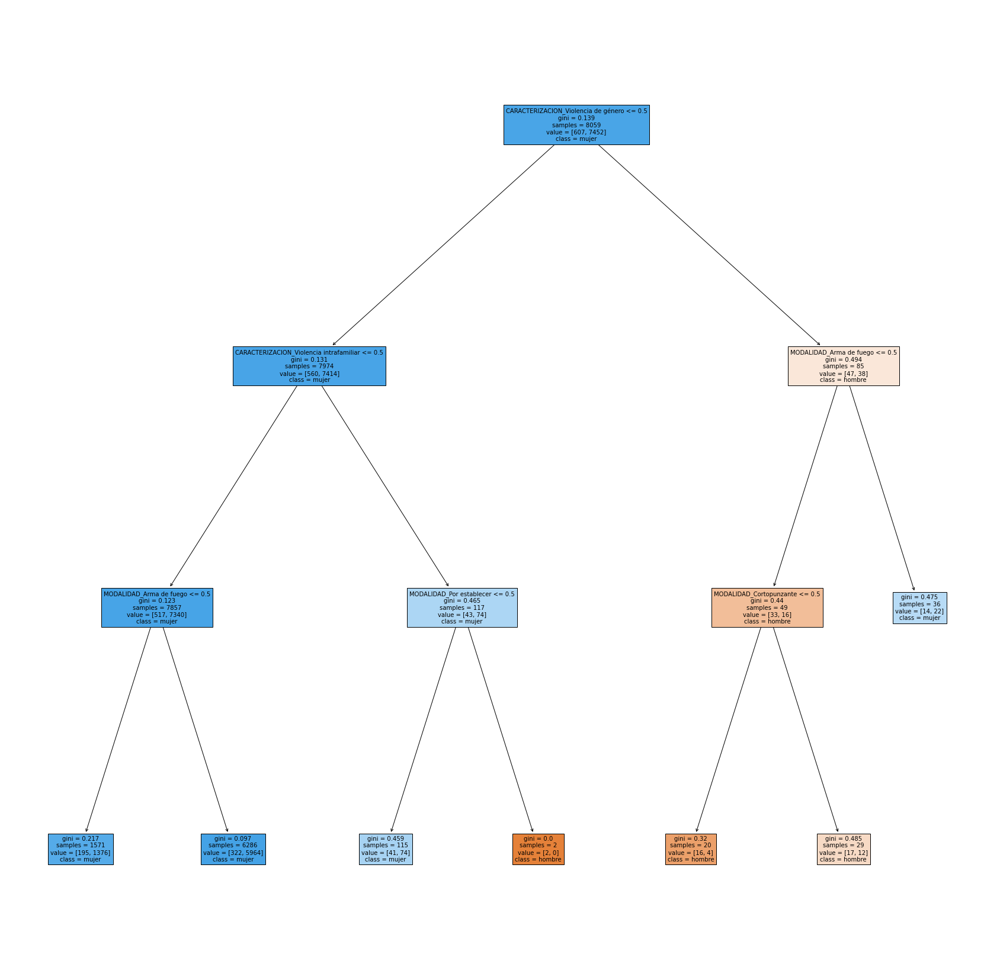

In [ ]:
from sklearn.tree import plot_tree
# Graficamos el árbol de desición creado por nuestro modelo.
fig = plt.figure(figsize=(30,30))

plot_tree(model,
          feature_names=X_train.columns,
          class_names=['hombre', 'mujer'],
          filled=True)
plt.show()

<center> <h1> <b> Conclusiones. </b> </h1> </center>

* Se logró identificar que el sexo, la edad, la ubicación, son factores de riesgo
* Se evidenció que si hay un pico en la cantidad de homicidios el cual se dio en el año 2009, a partir de este año la tendencia a apuntado a la disminución de los casos.
* Son muy marcadas las causas principales de homicios es Medellín; grupo de delincuencia organizados y homicidios relacionados a hurtos.
* Las modalidades de homicidios también muestran una tendencia clara y es que la gran mayoría de homicidios se efectuan con arma de fuego (78.4%)
* Las habilidades adquiridas en el curso permiten extraer información muy valiosa de un conjunto de datos.

<p><center><img height="100px" src="https://acegif.com/wp-content/gifs/gpsa-3.gif" align="center" hspace="10px" vspace="0px"></center></p>